In [226]:
import pymongo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
from nltk.collocations import *
from operator import itemgetter
from wordcloud import WordCloud
from textblob import TextBlob
from tqdm import tqdm_notebook as tq

In [2]:
headlines = pd.read_csv('headlines_df.csv')

In [3]:
headlines.head()

,brand,country,medium,headline,industry
0,Tzabar,Israel,Print,roger waters live in paris 3 nights concert €...,Transport & Tourism
1,Infiniti,United States,Print,accelerating the future,Automotive & Services
2,Toyota,Canada,Print,official ride of the spinfest amateur dj awards,Automotive & Services
3,Friends of the Earth,Germany,Print,travelling fruits cause pollution think global...,Public interest & Non-profit
4,Max Factor,Colombia,Print,the art of beauty,Beauty & Health


In [79]:
headlines.industry.value_counts()

Public interest & Non-profit                 3881
Food & Beverages                             2442
Automotive & Services                        2316
Professional & Public services               1970
House, Garden & Pets                         1641
Media & Publishing                           1608
Culture, Recreation & Sport                  1384
Electronics & Audio-Visual                   1334
Apparel, Clothing, Footwear & Accessories    1169
Beauty & Health                              1117
Retail & Distribution                         825
Financial & Legal services                    776
Transport & Tourism                           766
Pharmaceutical                                730
Alcoholic drinks                              688
Education                                     452
Industrial & Agricultural                     390
Toys & Games                                  288
Internet sites & Services                     232
Office equipment                              180


In [4]:
stop_words = stopwords.words('english')
stop_words += ['1','2','3','4','5','6','7','8','9','0']

In [227]:
spelled = []
for word in tq(words):
    correct = str(TextBlob(word).correct())
    spelled.append(correct)

KeyboardInterrupt: 

In [223]:
words = headlines.loc[headlines.industry == 'Public interest & Non-profit', 'headline'].ravel()
spelled = words.apply(lambda x: str(TextBlob(x).correct()))
# tokens = []
# for word in words:
#     token = word_tokenize(word)
#     tokens+=token
# stopped = [word for word in tokens if word not in stop_words]
# lemmatizer = nltk.stem.WordNetLemmatizer()
# lemmas = []
# for word in stopped:
#     if word != 'us':
#         lemma = lemmatizer.lemmatize(word)
#         lemmas.append(lemma)
#     else:
#         lemmas.append(word)
# common_words = Counter(lemmas).most_common(100)

KeyboardInterrupt: 

In [53]:
bigrams = nltk.collocations.BigramAssocMeasures()
bi_finder = BigramCollocationFinder.from_words(lemmas)
bi_scored = finder.score_ngrams(bigrams.raw_freq)
trigrams = nltk.collocations.TrigramAssocMeasures()
tri_finder = TrigramCollocationFinder.from_words(lemmas)
tri_scored = finder.score_ngrams(trigrams.raw_freq)

In [66]:
bi_scored_sort = sorted(bi_scored, key=itemgetter(1), reverse=True)
tri_scored_sort = sorted(tri_scored, key=itemgetter(1), reverse=True)
word_freq_dict = {}
bi_freq_dict = {}
tri_freq_dict = {}
for i in range(len(common_words)):
    word_freq_dict[common_words[i][0]] = common_words[i][1]
for i in range(len(bi_scored_sort)):
    bi_freq_dict[' '.join(bi_scored_sort[i][0])] = bi_scored_sort[i][1]
for i in range(len(tri_scored_sort)):
    text = ' '.join(tri_scored_sort[i][0])
    if 'longxi' in text:
        pass
    else:
        tri_freq_dict[text] = tri_scored_sort[i][1]

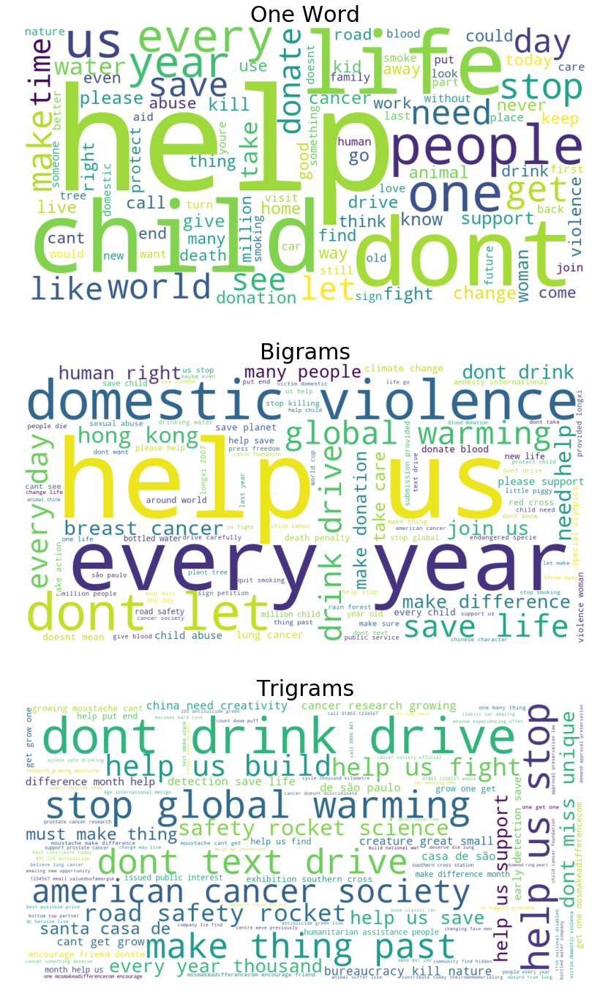

In [78]:
wc1 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(word_freq_dict)
wc2 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(bi_freq_dict)
wc3 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(tri_freq_dict)
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,24))
ax1.axis('off'), ax2.axis('off'), ax3.axis('off')
ax1.set_title('One Word', fontdict={'fontsize':30}), ax2.set_title('Bigrams', fontdict={'fontsize':30}), 
ax3.set_title('Trigrams', fontdict={'fontsize':30})
ax1.imshow(wc1, interpolation = 'bilinear')
ax2.imshow(wc2, interpolation = 'bilinear')
ax3.imshow(wc3, interpolation = 'bilinear')

In [159]:
def df_word_analyzer(filter_column_variable_name, stop_words, new_stop_words):
    words = headlines.loc[headlines.industry == filter_column_variable_name, 'headline'].ravel()
    tokens = []
    for word in words:
        token = word_tokenize(word)
        tokens+=token
    stop_words += new_stop_words
    stopped = [word for word in tokens if word not in stop_words]
    lemmatizer = nltk.stem.WordNetLemmatizer()
    lemmas = []
    for word in stopped:
        if word != 'us':
            lemma = lemmatizer.lemmatize(word)
            lemmas.append(lemma)
        else:
            lemmas.append(word)
    common_words = Counter(lemmas).most_common(100)
    bigrams = nltk.collocations.BigramAssocMeasures()
    bi_finder = BigramCollocationFinder.from_words(lemmas)
    bi_scored = bi_finder.score_ngrams(bigrams.raw_freq)
    trigrams = nltk.collocations.TrigramAssocMeasures()
    tri_finder = TrigramCollocationFinder.from_words(lemmas)
    tri_scored = tri_finder.score_ngrams(trigrams.raw_freq)
    bi_scored_sort = sorted(bi_scored, key=itemgetter(1), reverse=True)
    tri_scored_sort = sorted(tri_scored, key=itemgetter(1), reverse=True)
    word_freq_dict = {}
    bi_freq_dict = {}
    tri_freq_dict = {}
    for i in range(len(common_words)):
        word_freq_dict[common_words[i][0]] = common_words[i][1]
    for i in range(len(bi_scored_sort)):
        bi_freq_dict[' '.join(bi_scored_sort[i][0])] = bi_scored_sort[i][1]
    for i in range(len(tri_scored_sort)):
        text = ' '.join(tri_scored_sort[i][0])
        if 'longxi' in text:
            pass
        else:
            tri_freq_dict[text] = tri_scored_sort[i][1]
    return word_freq_dict, bi_freq_dict, tri_freq_dict

In [101]:
def word_cloud(word_freq, bigram_freq, trigram_freq):
    wc1 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(word_freq)
    wc2 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(bigram_freq)
    wc3 = WordCloud(max_words=100, height = 500, width = 1000, background_color='white').generate_from_frequencies(trigram_freq)
    fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,24))
    ax1.axis('off'), ax2.axis('off'), ax3.axis('off')
    ax1.set_title('One Word', fontdict={'fontsize':30}), ax2.set_title('Bigrams', fontdict={'fontsize':30}), 
    ax3.set_title('Trigrams', fontdict={'fontsize':30})
    ax1.imshow(wc1, interpolation = 'bilinear')
    ax2.imshow(wc2, interpolation = 'bilinear')
    ax3.imshow(wc3, interpolation = 'bilinear')
    return None

In [99]:
food_stop_words = ['china', 'oreo']
food_word_freq, food_bigram_freq, food_trigram_freq = df_word_analyzer('Food & Beverages', stop_words, )

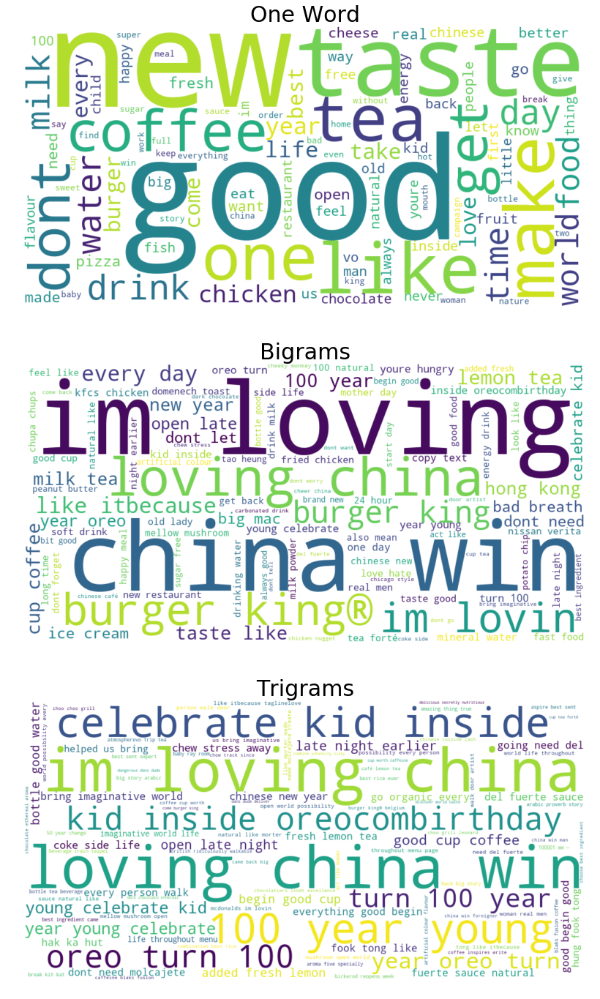

In [102]:
word_cloud(food_word_freq, food_bigram_freq, food_trigram_freq)

In [104]:
headlines.loc[headlines.industry == 'Food & Beverages', 'country'].value_counts()

United States           337
China                   255
Brazil                  184
United Kingdom          161
France                  101
India                    88
Australia                80
Canada                   80
Germany                  78
Taiwan                   63
Italy                    52
Spain                    49
United Arab Emirates     48
South Africa             42
Argentina                37
New Zealand              34
Chile                    29
Turkey                   29
Egypt                    28
Mexico                   27
Sweden                   27
Switzerland              23
Colombia                 23
Singapore                23
Belgium                  22
Nigeria                  21
Israel                   21
Indonesia                18
Russia                   17
Portugal                 16
                       ... 
Puerto Rico               5
Bulgaria                  4
Hungary                   4
Tunisia                   4
Guatemala           

In [165]:
car_stop_words = ['volkswagen', 'volvo','peugeot','nissan','mercedesbenz','audi','ford','bmw','jeep','toyota','mini','yaris']
car_word_freq, car_bigram_freq, car_trigram_freq = df_word_analyzer('Automotive & Services', stop_words,car_stop_words)

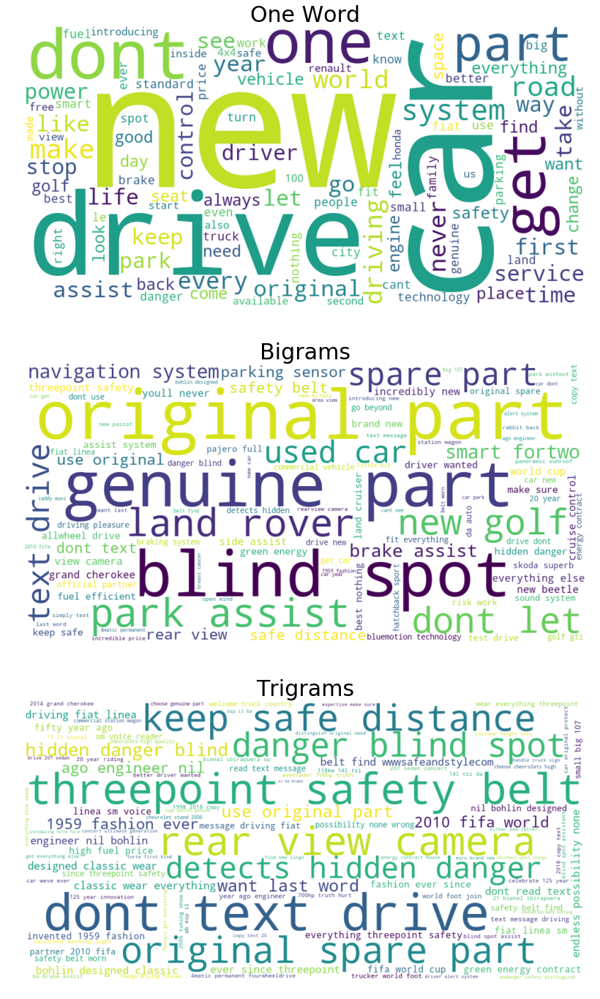

In [166]:
word_cloud(car_word_freq, car_bigram_freq, car_trigram_freq)

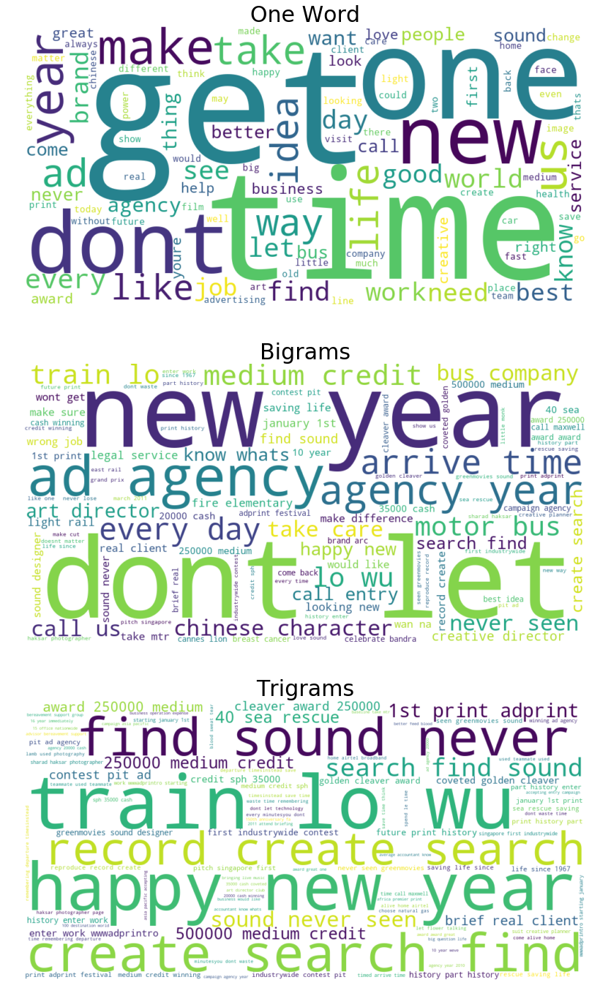

In [167]:
prof_stop_words = ['hong', 'kong', 'lo wu', 'kowloon']
prof_word_freq, prof_bigram_freq, prof_trigram_freq = df_word_analyzer('Professional & Public services', stop_words, prof_stop_words)
word_cloud(prof_word_freq, prof_bigram_freq, prof_trigram_freq)

In [171]:
house_stop_words = ['energizer']
house_word_freq, house_bigram_freq, house_trigram_freq = df_word_analyzer('House, Garden & Pets', stop_words, house_stop_words)

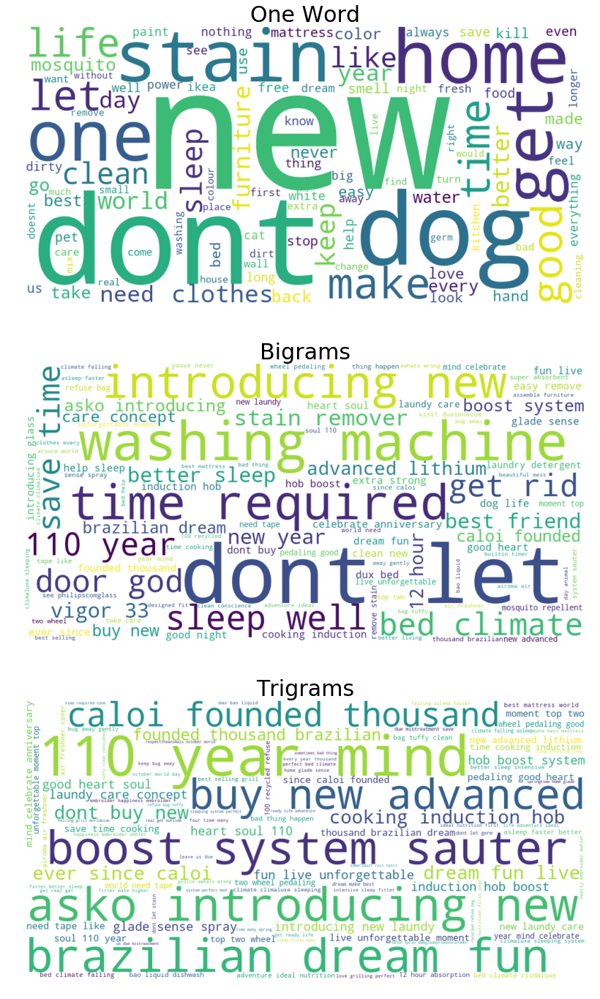

In [172]:
word_cloud(house_word_freq, house_bigram_freq, house_trigram_freq)

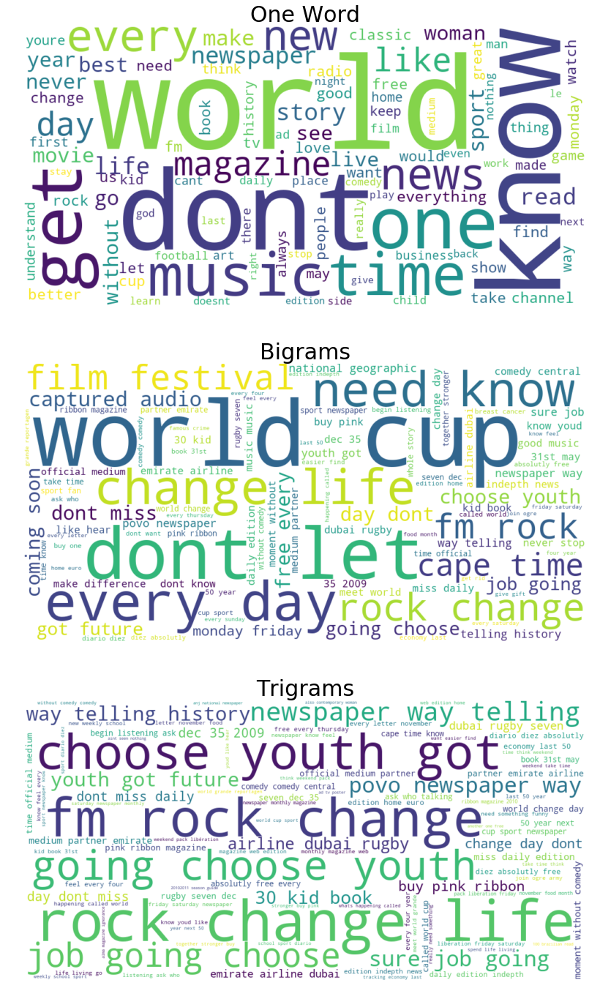

In [176]:
media_stop_words = ['ouï', 'letudiantfr', 'emirate', 'ceará']
media_word_freq, media_bigram_freq, media_trigram_freq = df_word_analyzer('Media & Publishing', stop_words, media_stop_words)
word_cloud(media_word_freq, media_bigram_freq, media_trigram_freq)

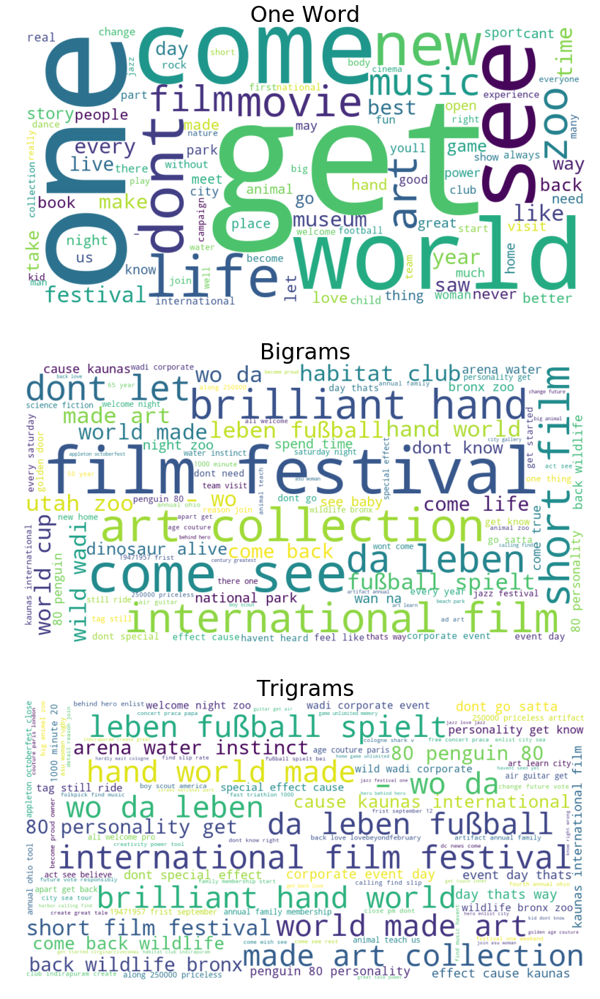

In [180]:
sport_stop_words = ['elbkicktv', 'elbkicktv', 'masp', 'hogle']
sport_word_freq, sport_bigram_freq, sport_trigram_freq = df_word_analyzer('Culture, Recreation & Sport', stop_words, sport_stop_words)
word_cloud(sport_word_freq, sport_bigram_freq, sport_trigram_freq)

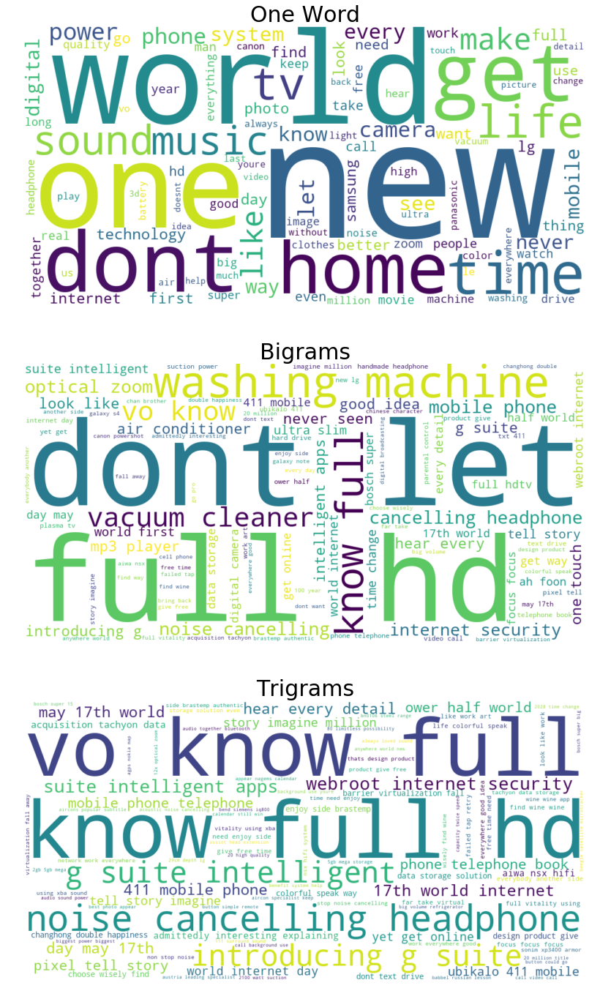

In [182]:
electronics_stop_words = ['sony']
electronics_word_freq, electronics_bigram_freq, electronics_trigram_freq = df_word_analyzer('Electronics & Audio-Visual', stop_words, electronics_stop_words)
word_cloud(electronics_word_freq, electronics_bigram_freq, electronics_trigram_freq)

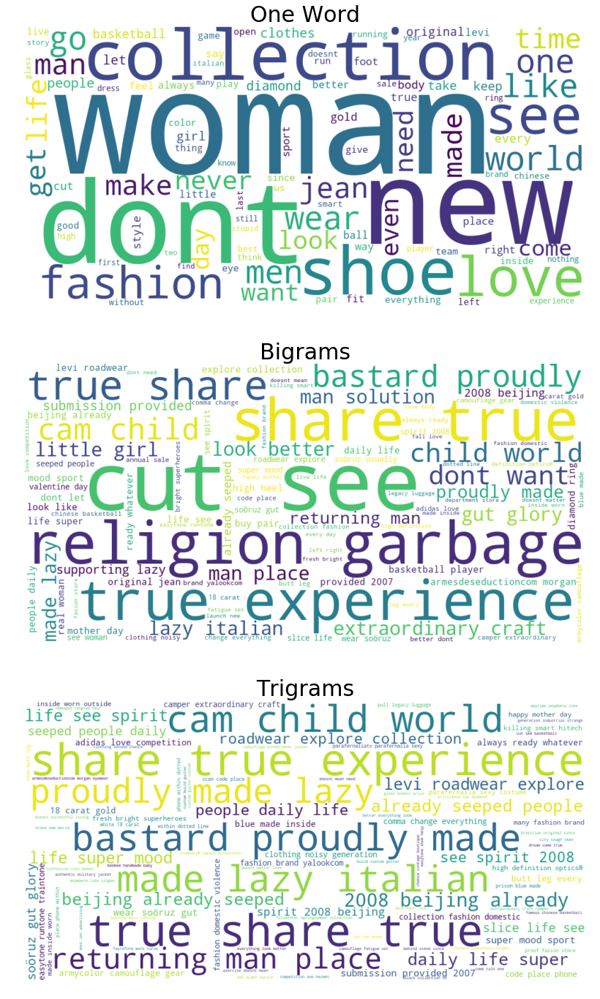

In [192]:
clothes_stop_words = ['gasjeanscom','nike', 'olympics', 'wrangler','michel', 'desjoyeaux','leviscom','levi', 'longxi', '501']
clothes_word_freq, clothes_bigram_freq, clothes_trigram_freq = df_word_analyzer('Apparel, Clothing, Footwear & Accessories', stop_words, clothes_stop_words)
word_cloud(clothes_word_freq, clothes_bigram_freq, clothes_trigram_freq)

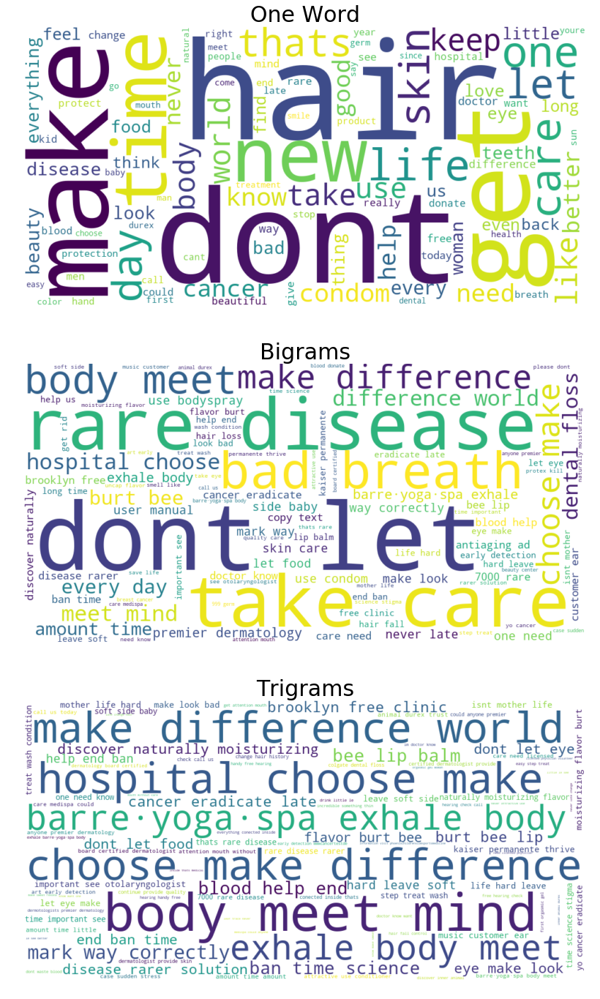

In [188]:
beauty_stop_words = ['mountsinaiorg','axe', 'burt', 'bee']
beauty_word_freq, beauty_bigram_freq, beauty_trigram_freq = df_word_analyzer('Beauty & Health', stop_words, beauty_stop_words)
word_cloud(beauty_word_freq, beauty_bigram_freq, beauty_trigram_freq)

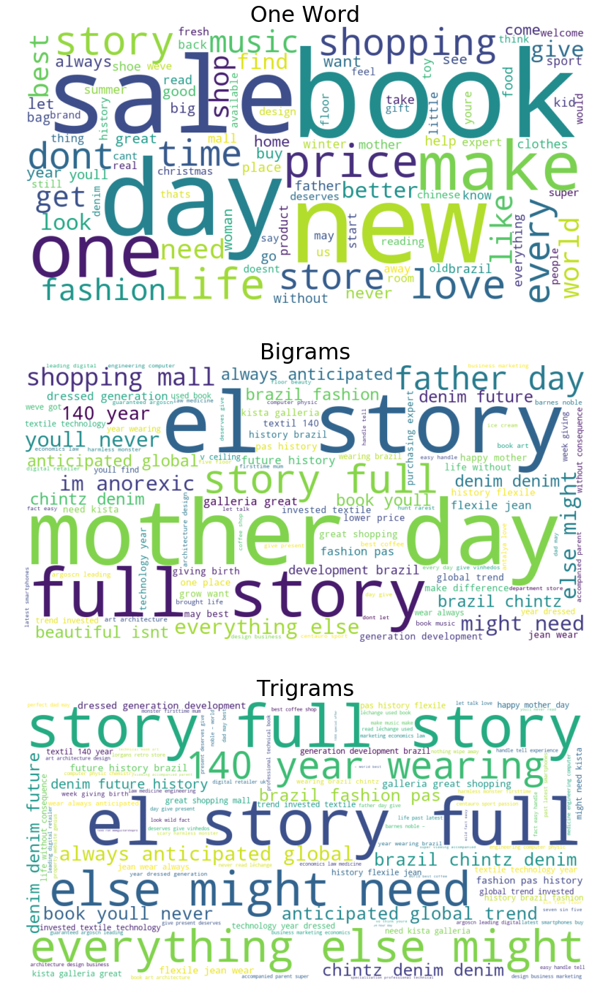

In [196]:
retail_stop_words = ['nichols', 'harvey', 'ateneo', '790', 'ft2', '505', '903', 'cedro']
retail_word_freq, retail_bigram_freq, retail_trigram_freq = df_word_analyzer('Retail & Distribution', stop_words, retail_stop_words)
word_cloud(retail_word_freq, retail_bigram_freq, retail_trigram_freq)

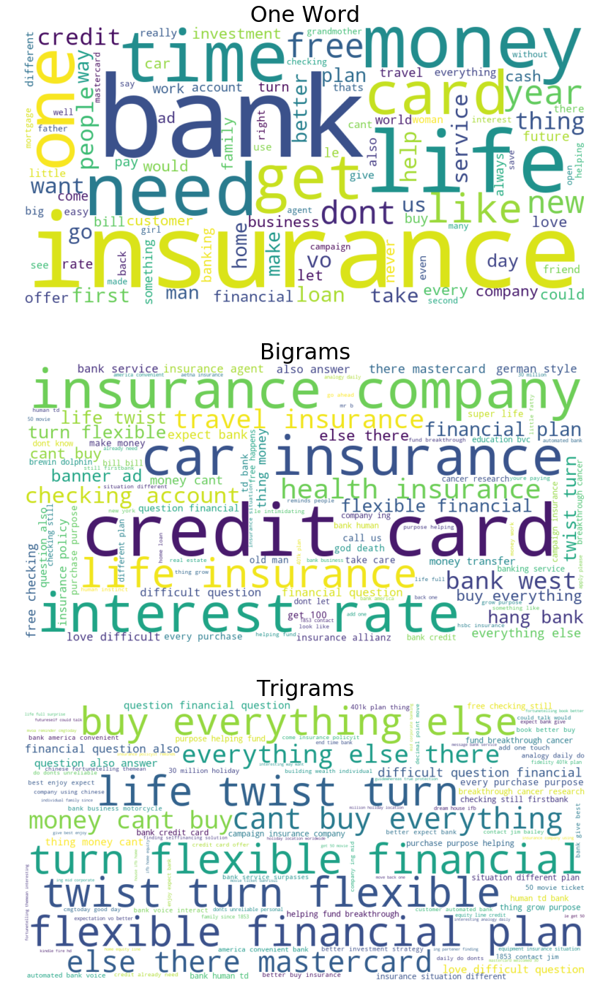

In [200]:
finance_stop_words = ['seng', 'china','fubon']
finance_word_freq, finance_bigram_freq, finance_trigram_freq = df_word_analyzer('Financial & Legal services', stop_words, finance_stop_words)
word_cloud(finance_word_freq, finance_bigram_freq, finance_trigram_freq)

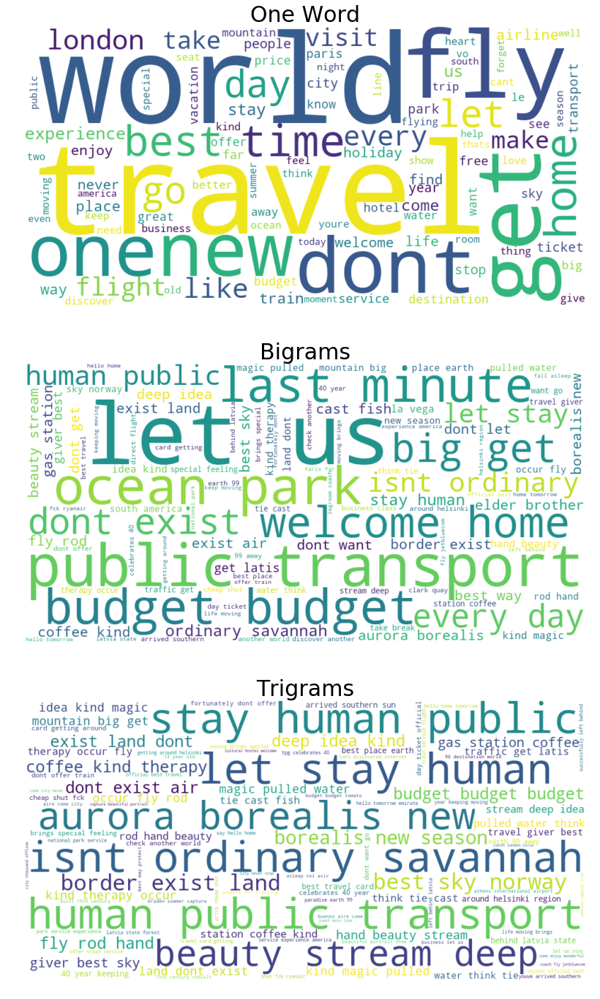

In [204]:
transport_stop_words = ['wwwpowdermountaincom', 'powder', 'rudeville', 'rudechalets']
transport_word_freq, transport_bigram_freq, transport_trigram_freq = df_word_analyzer('Transport & Tourism', stop_words, transport_stop_words)
word_cloud(transport_word_freq, transport_bigram_freq, transport_trigram_freq)

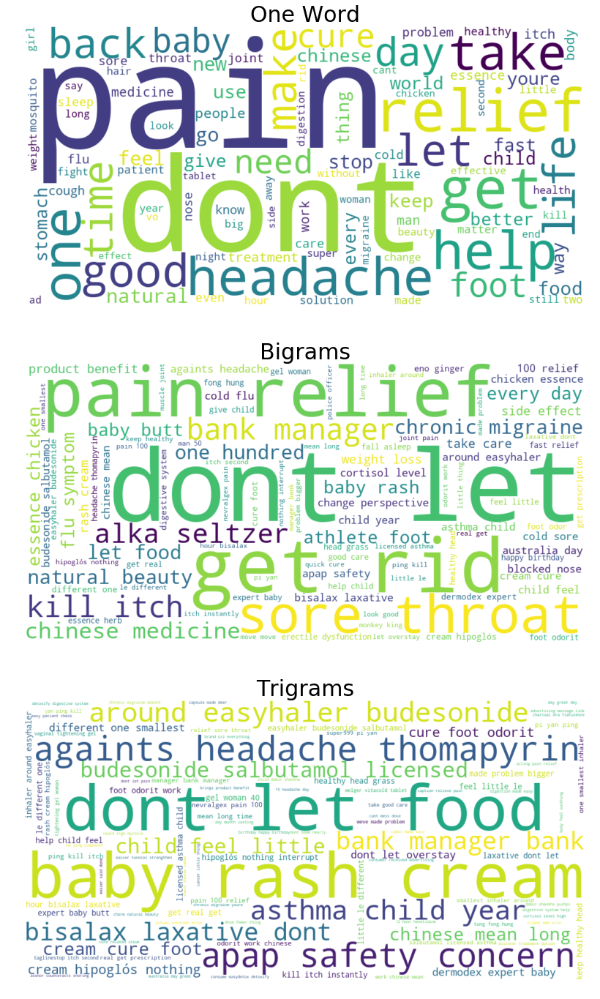

In [208]:
pharma_stop_words = ['999which', '999']
pharma_word_freq, pharma_bigram_freq, pharma_trigram_freq = df_word_analyzer('Pharmaceutical', stop_words, pharma_stop_words)
word_cloud(pharma_word_freq, pharma_bigram_freq, pharma_trigram_freq)

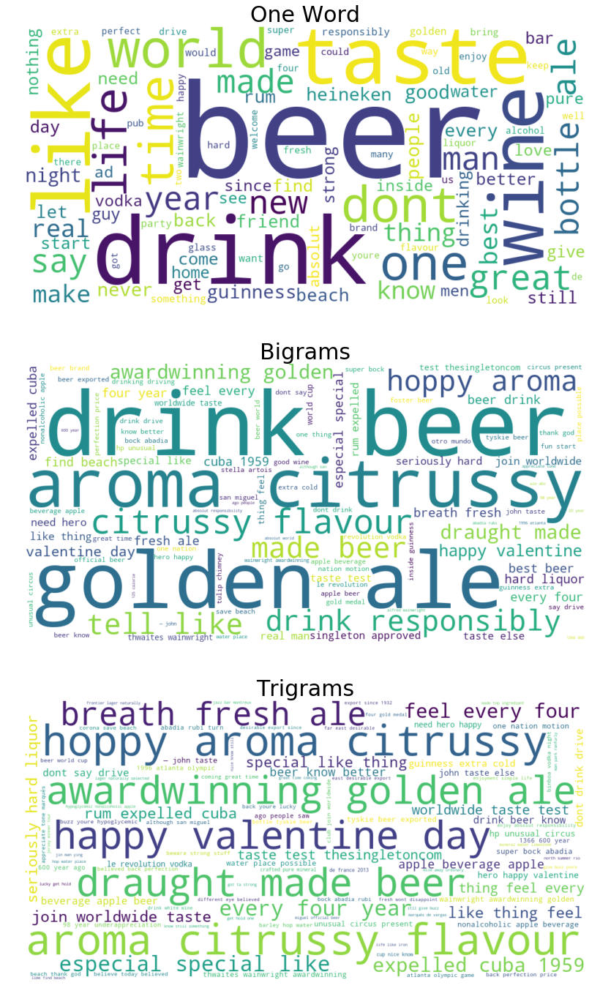

In [212]:
alc_stop_words = ['carlton','eristoff','tsingtao','jameson','matusalem','brahmacom','modelo','guiness']
alc_word_freq, alc_bigram_freq, alc_trigram_freq = df_word_analyzer('Alcoholic drinks', stop_words,alc_stop_words)
word_cloud(alc_word_freq, alc_bigram_freq, alc_trigram_freq)

In [219]:
words = headlines.headline.ravel()
tokens = []
for word in words:
    token = word_tokenize(word)
    tokens+=token
num_words = len(tokens)
num_unique_words = len(set(tokens))
num_words,num_unique_words

(330442, 28423)